In [1]:
# code is based on https://www.kaggle.com/vbookshelf/play-audio-read-the-files-create-a-spectrogram

In [2]:
import pandas as pd
import numpy as np
import os

import matplotlib.pyplot as plt
%matplotlib inline

# Don't Show Warning Messages
import warnings
warnings.filterwarnings('ignore')

In [3]:
!ls 

demographic_info.txt  Overview.ipynb  Respiratory_Sound_Database
new_slice.wav	      README.md


In [4]:
os.listdir('Respiratory_Sound_Database')

['patient_diagnosis.csv',
 'audio_and_txt_files',
 '.DS_Store',
 'filename_format.txt',
 'filename_differences.txt']

In [5]:
! pip install pydub

In [6]:
# Play an audio file

from pydub import AudioSegment
import IPython

# We will listen to this file:
# 213_1p5_Pr_mc_AKGC417L.wav

audio_file = '213_1p5_Pr_mc_AKGC417L.wav'

path = 'Respiratory_Sound_Database/audio_and_txt_files/' + audio_file

IPython.display.Audio(path)

In [7]:
path ='demographic_info.txt'
col_names = ['patient_id', 'age', 'sex', 'adult_bmi', 'child_weight', 'child_height']

# Adult BMI (kg/m2)
# Child Weight (kg)
# Child Height (cm)

df_demo = pd.read_csv(path, sep=" ", header=None, names=col_names)

df_demo.head(10)

,patient_id,age,sex,adult_bmi,child_weight,child_height
0,101,3.00,F,NaN,19.0,99.0
1,102,0.75,F,NaN,9.8,73.0
2,103,70.00,F,33.00,NaN,NaN
3,104,70.00,F,28.47,NaN,NaN
4,105,7.00,F,NaN,32.0,135.0
5,106,73.00,F,21.00,NaN,NaN
6,107,75.00,F,33.70,NaN,NaN
7,108,3.00,M,NaN,NaN,NaN
8,109,84.00,F,33.53,NaN,NaN
9,110,75.00,M,25.21,NaN,NaN


In [8]:
path = 'Respiratory_Sound_Database/patient_diagnosis.csv'

df_diag = pd.read_csv(path, header=None, names=['patient_id', 'diagnosis'])

df_diag.head(10)



,patient_id,diagnosis
0,101,URTI
1,102,Healthy
2,103,Asthma
3,104,COPD
4,105,URTI
5,106,COPD
6,107,COPD
7,108,LRTI
8,109,COPD
9,110,COPD


In [9]:
path = 'Respiratory_Sound_Database/filename_differences.txt'

df_diff = pd.read_csv(path, sep=" ", header=None, names=['file_names'])

df_diff.head(10)

,file_names
0,'101_1b1_Al_sc_AKGC417L'
1,'101_1b1_Pr_sc_AKGC417L'
2,'102_1b1_Ar_sc_AKGC417L'
3,'105_1b1_Tc_sc_LittC2SE'
4,'108_1b1_Al_sc_LittC2SE'
5,'111_1b2_Tc_sc_LittC2SE'
6,'111_1b3_Tc_sc_LittC2SE'
7,'115_1b1_Ar_sc_LittC2SE'
8,'116_1b2_Pl_sc_LittC2SE'
9,'116_1b2_Tc_sc_LittC2SE'


In [10]:
path = 'Respiratory_Sound_Database/filename_format.txt'

data = open(path, 'r').read()

data

'Elements contained in the filenames:\n\nPatient number (101,102,...,226)\nRecording index\nChest location (Trachea (Tc), {Anterior (A), Posterior (P), Lateral (L)}{left (l), right (r)})\nAcquisition mode (sequential/single channel (sc), simultaneous/multichannel (mc))\nRecording equipment (AKG C417L Microphone, 3M Littmann Classic II SE Stethoscope, 3M Litmmann 3200 Electronic Stethoscope, WelchAllyn Meditron Master Elite Electronic Stethoscope)'

## Create an Audio Spectrogram

In [11]:
path = 'Respiratory_Sound_Database/audio_and_txt_files/154_2b4_Al_mc_AKGC417L.txt'

col_names = ['Beginning_of_respiratory_cycle', 'End_of_respiratory_cycle', 'Presence/absence_of_crackles', 'Presence/absence_of_wheezes']

# Respiratory cycle column values are in 'seconds'.
# Presence = 1
# Absence = 0

df_annot = pd.read_csv(path, sep="\t", header=None, names=col_names)

df_annot.head(10)

,Beginning_of_respiratory_cycle,End_of_respiratory_cycle,Presence/absence_of_crackles,Presence/absence_of_wheezes
0,1.330,3.804,0,0
1,3.804,6.396,0,0
2,6.396,8.938,1,0
3,8.938,11.580,1,0
4,11.580,14.072,1,0
5,14.072,17.049,1,0
6,17.049,19.490,1,0


In [12]:
# Install the pysoundfile library
! pip install pysoundfile

In [13]:
!pip install librosa

In [57]:
import soundfile as sf
import matplotlib.mlab as mlab
import math
from scipy import signal
import librosa
import librosa.display
# Define helper functions

# Load a .wav file. 
# These are 24 bit files. The PySoundFile library is able to read 24 bit files.
# https://pysoundfile.readthedocs.io/en/0.9.0/


nfft = 200 # Length of each window segment
fs = 8000 # Sampling frequencies
noverlap = 120 # Overlap between windows
#noverlap = round(nfft * 0.95) # Overlap between windows
pad_to = round(nfft * 3)

# source: Andrew Ng Deep Learning Specialization, Course 5
def graph_plt_spectrogram(wav_file):
    data, rate = librosa.load(wav_file)
    nchannels = data.ndim
    if nchannels == 2:
        data = data[:,0]
    pxx, freqs, bins, im = plt.specgram(data, nfft, fs, noverlap = noverlap, pad_to = pad_to)
    #return pxx

def graph_mlab_spectrogram(wav_file):
    data, rate = librosa.load(wav_file)
    nchannels = data.ndim
    if nchannels == 2:
        data = data[:,0]
    Pxx, freqs, t = mlab.specgram(data, nfft, fs, noverlap = noverlap, pad_to = pad_to)   
    plt.pcolormesh(t, freqs, Pxx)
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    plt.show()
    #ha.set_xscale('log')
    
def graph_librosa_spectrogram(wav_file, log=True):
    y, sr = librosa.load(wav_file)
    librosa.display.waveplot(y, sr=sr)
    ps = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=nfft, hop_length=noverlap)
    if log == True:
        ps_db = librosa.power_to_db(ps, ref=np.max)
        librosa.display.specshow(ps_db, y_axis='log', x_axis='time')
    else:
        librosa.display.specshow(ps, y_axis='mel', x_axis='time')
    return ps

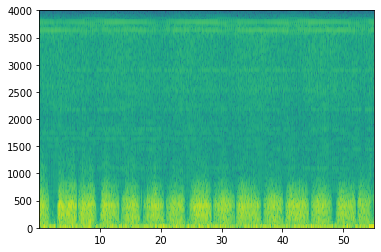

In [80]:
# plot the spectrogram

path = 'Respiratory_Sound_Database/audio_and_txt_files/105_1b1_Tc_sc_Meditron.wav'

#matplotlib plt.specgram
graph_plt_spectrogram(path)



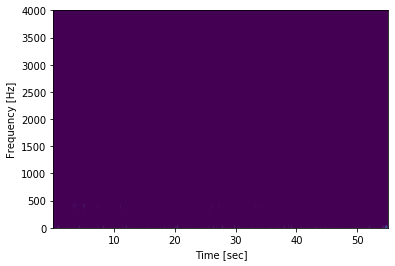

In [81]:
#matplotlib matlab.specgram
graph_mlab_spectrogram(path)

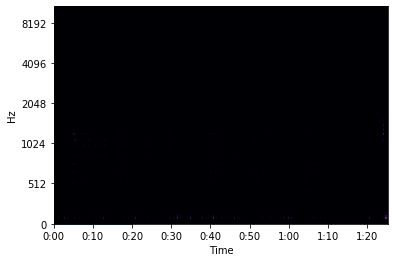

In [82]:
ps = graph_librosa_spectrogram(path,log=False)

# Reconstruct a noisy data from spectrogram 

In [84]:
IPython.display.Audio(path)

In [89]:
#Use griffinlim algorithm to reconstruct audio from mel spectrogram

wav, sr = librosa.load(path)

y_inv = librosa.feature.inverse.mel_to_audio(ps, sr=sr, n_fft=nfft, hop_length = noverlap)

sf.write('rec.wav', y_inv, sr)

In [91]:
IPython.display.Audio('rec.wav')

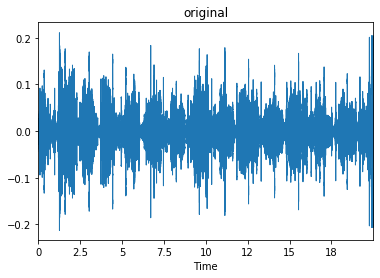

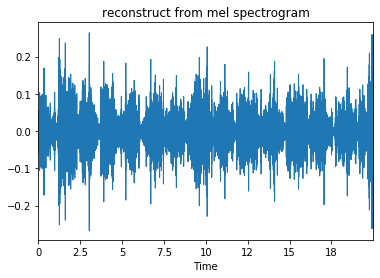

In [88]:
librosa.display.waveplot(wav, sr=sr)
plt.title('original')
plt.show()
librosa.display.waveplot(y_inv, sr=sr)
plt.title('reconstruct from mel spectrogram')
plt.show()

# Assumption: Noise reduction apply on Spectrogram might not work

# Read an audio file as a numpy array

In [54]:
# choose an audio file
audio_file = '154_2b4_Al_mc_AKGC417L.wav'

path = 'Respiratory_Sound_Database/audio_and_txt_files/' + audio_file

# read the file
data, rate = sf.read(path)

# display the numpy array
data


array([0.        , 0.        , 0.        , ..., 0.02538395, 0.02573287,
       0.02593136])

In [55]:
# https://stackoverflow.com/questions/37999150/
# python-how-to-split-a-wav-file-into-multiple-wav-files

from pydub import AudioSegment

# note: Time is given in seconds. Will be converted to milliseconds later.
start_time = 0
end_time = 7

t1 = start_time * 1000 # pydub works in milliseconds
t2 = end_time * 1000
newAudio = AudioSegment.from_wav(path) # path is defined above
newAudio = newAudio[t1:t2]
newAudio.export('new_slice.wav', format="wav")

<_io.BufferedRandom name='new_slice.wav'>

In [92]:
IPython.display.Audio('new_slice.wav')